#Location-based Analysis
Location-Based Analysis refers to the process of analyzing data based on geographic locations to uncover patterns, trends, or insights that are tied to specific places. In the context of restaurants, this analysis would typically involve exploring how the location of each restaurant influences various factors, such as customer behavior, ratings, popularity, pricing, or the type of cuisine offered.


In [1]:
# Import necessary libraries
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loading the dataset
df = pd.read_csv('/content/Dataset .csv')

In [3]:
# Checking the dataset structure
print(df.head())
print(df.info())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [4]:
# Standardize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Ensure latitude and longitude are numeric
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df['longitude'] = pd.to_numeric(df['longitude'], errors='coerce')


In [5]:
# Drop rows with missing coordinates
df.dropna(subset=['latitude', 'longitude'], inplace=True)

In [6]:
### 1. Visualize Restaurant Distribution on a Map
# Create a GeoDataFrame for mapping
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['longitude'], df['latitude']))

In [7]:
# Generate an interactive map using Folium
restaurant_map = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=12)

In [8]:
# Add restaurant points to the map
for _, row in df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['locality']} - {row['aggregate_rating']}⭐ ({row['cuisines']})"
    ).add_to(restaurant_map)


In [9]:
# Save and display the map
restaurant_map.save("restaurant_map.html")
print("Map saved as 'restaurant_map.html'.")

Map saved as 'restaurant_map.html'.


In [10]:
# Group by city and calculate statistics
city_stats = df.groupby('city').agg(
    total_restaurants=('locality', 'count'),
    avg_rating=('aggregate_rating', 'mean'),
    avg_cost_for_two=('average_cost_for_two', 'mean'),
    price_range=('price_range', 'mean')
).reset_index()

# Display the statistics
print(city_stats)


                 city  total_restaurants  avg_rating  avg_cost_for_two  \
0           Abu Dhabi                 20    4.300000        182.000000   
1                Agra                 20    3.965000       1065.000000   
2           Ahmedabad                 21    4.161905        857.142857   
3              Albany                 20    3.555000         19.750000   
4           Allahabad                 20    3.395000        517.500000   
..                ...                ...         ...               ...   
105  Vineland Station                  1    4.300000         70.000000   
106          Waterloo                 20    3.650000         21.250000   
107           Weirton                  1    3.900000         25.000000   
108    Winchester Bay                  1    3.200000         25.000000   
109           Yorkton                  1    3.300000         25.000000   

     price_range  
0       3.300000  
1       2.650000  
2       2.571429  
3       1.700000  
4       2.650000

In [11]:
# Group by locality for more granularity
locality_stats = df.groupby('locality').agg(
    total_restaurants=('locality', 'count'),
    avg_rating=('aggregate_rating', 'mean'),
    price_range=('price_range', 'mean')
).reset_index()

# Display the statistics
print(locality_stats)


                                locality  total_restaurants  avg_rating  \
0      ILD Trade Centre Mall, Sohna Road                  2    3.050000   
1    12th Square Building, Banjara Hills                  1    4.300000   
2                  A Hotel, Gurdev Nagar                  1    3.600000   
3               ARSS Mall, Paschim Vihar                  1    3.100000   
4                             Aaya Nagar                  1    0.000000   
..                                   ...                ...         ...   
738                              Yorkton                  1    3.300000   
739             Z Square Mall, Mall Road                  1    4.000000   
740                          Zoo Tiniali                  4    4.225000   
741             ibis New Delhi, Aerocity                  2    1.550000   
742                         �guas Claras                  3    3.666667   

     price_range  
0       1.500000  
1       3.000000  
2       2.000000  
3       2.000000  
4   

<ipython-input-12-ccd4d8398cf2>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=city_stats, x='total_restaurants', y='city', palette='viridis')


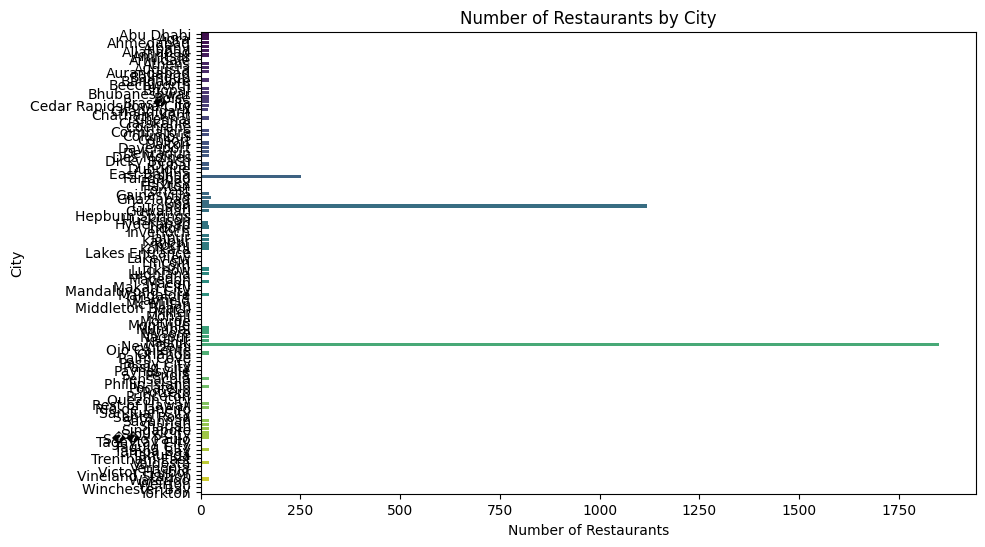

In [12]:
### 3. Visualize Concentration of Restaurants by City
# Plot number of restaurants per city
plt.figure(figsize=(10, 6))
sns.barplot(data=city_stats, x='total_restaurants', y='city', palette='viridis')
plt.title("Number of Restaurants by City")
plt.xlabel("Number of Restaurants")
plt.ylabel("City")
plt.show()


<ipython-input-13-853a89ad29b8>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_10_cities, x='total_restaurants', y='city', palette='viridis')


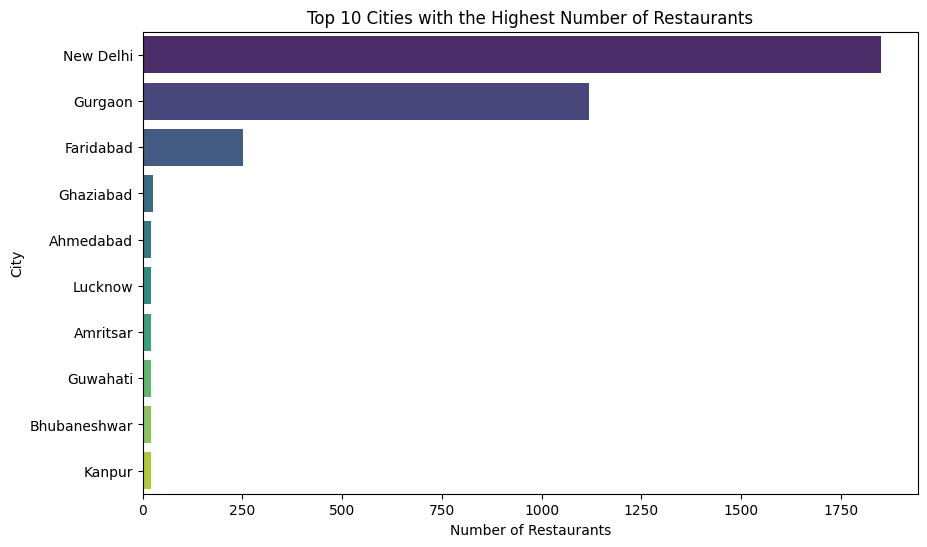

In [13]:
# Sort the city_stats by 'total_restaurants' in descending order and select top 10
top_10_cities = city_stats.sort_values(by='total_restaurants', ascending=False).head(10)

# Plot number of restaurants per city
plt.figure(figsize=(10, 6))
sns.barplot(data=top_10_cities, x='total_restaurants', y='city', palette='viridis')
plt.title("Top 10 Cities with the Highest Number of Restaurants")
plt.xlabel("Number of Restaurants")
plt.ylabel("City")
plt.show()


<ipython-input-14-21ad9a732d42>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_localities, x='total_restaurants', y='locality', palette='magma')


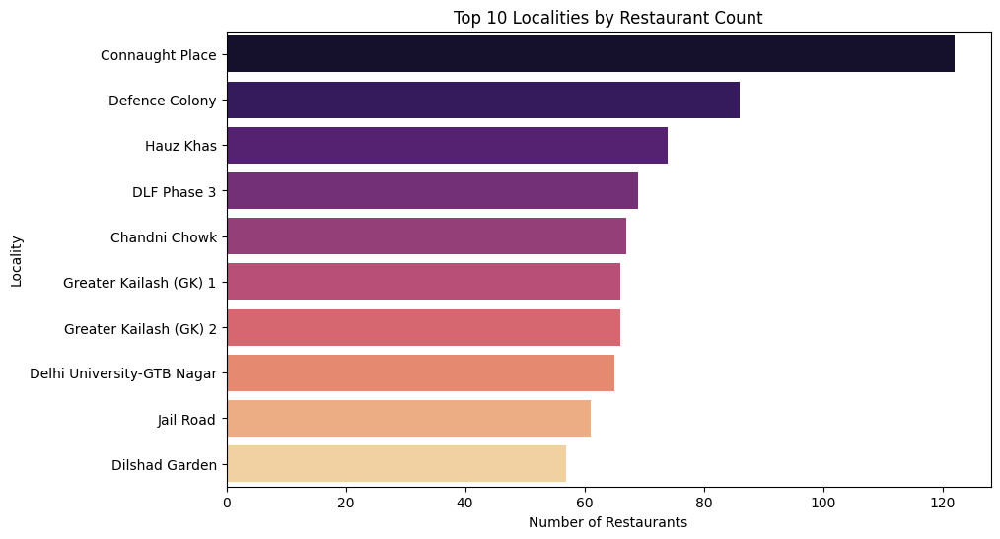

In [14]:
# Plot number of restaurants per locality
top_localities = locality_stats.nlargest(10, 'total_restaurants')
plt.figure(figsize=(10, 6))
sns.barplot(data=top_localities, x='total_restaurants', y='locality', palette='magma')
plt.title("Top 10 Localities by Restaurant Count")
plt.xlabel("Number of Restaurants")
plt.ylabel("Locality")
plt.show()

<ipython-input-15-d69bd17e909a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_top_10, x='aggregate_rating', y='city', palette='coolwarm')


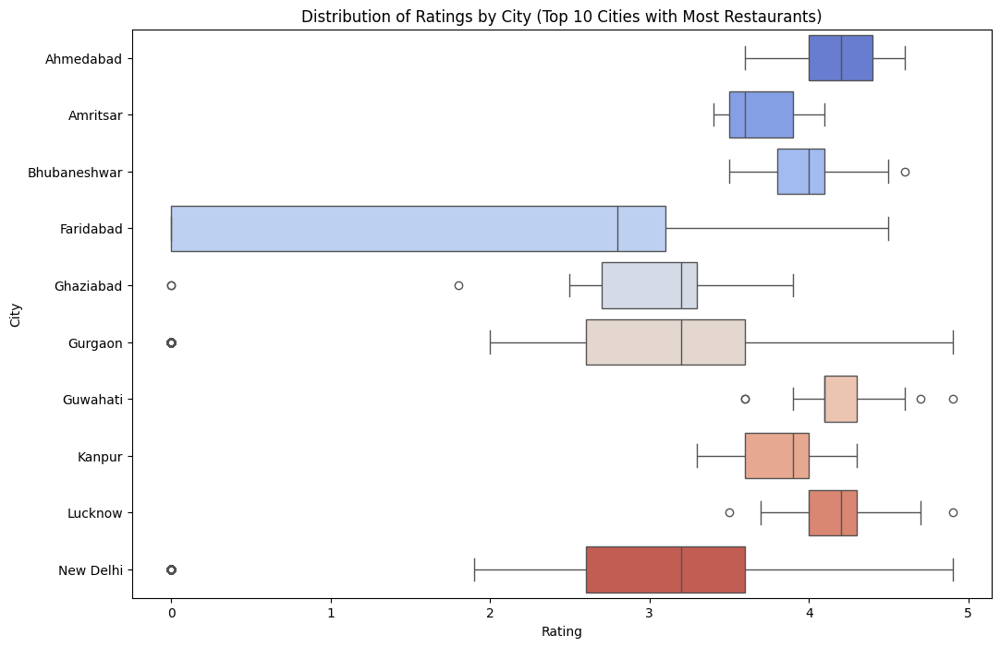

In [15]:
# Step 1: Sort the cities by the total number of restaurants and select top 10
top_10_cities = city_stats.sort_values(by='total_restaurants', ascending=False).head(10)

# Step 2: Filter the original dataframe to include only the top 10 cities
df_top_10 = df[df['city'].isin(top_10_cities['city'])]

# Step 3: Create a boxplot for ratings by city
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_top_10, x='aggregate_rating', y='city', palette='coolwarm')
plt.title("Distribution of Ratings by City (Top 10 Cities with Most Restaurants)")
plt.xlabel("Rating")
plt.ylabel("City")
plt.show()


In [16]:
# Filter restaurants with ratings > 4.5
high_rated = df[df['aggregate_rating'] > 4.5]

# Print the number of high-rated restaurants
print(f"Number of high-rated restaurants: {len(high_rated)}")

# Display the relevant columns: name, city, locality, and rating
print(high_rated[['restaurant_name', 'city', 'locality', 'aggregate_rating']])



Number of high-rated restaurants: 143
                               restaurant_name              city  \
0                             Le Petit Souffle       Makati City   
3                                         Ooma  Mandaluyong City   
4                                  Sambo Kojin  Mandaluyong City   
8     Spiral - Sofitel Philippine Plaza Manila        Pasay City   
9                                     Locavore        Pasig City   
...                                        ...               ...   
3014                  Zabardast Indian Kitchen         New Delhi   
3310                             Spezia Bistro         New Delhi   
3601                 Indian Accent - The Manor         New Delhi   
3732                                    Tashan         New Delhi   
4298                            Masala Library         New Delhi   

                                         locality  aggregate_rating  
0       Century City Mall, Poblacion, Makati City               4.8  
3    

In [17]:
# Example: Localities with most affordable average price range
affordable_localities = locality_stats.nsmallest(10, 'price_range')
print("Top 10 most affordable localities:")
print(affordable_localities)

Top 10 most affordable localities:
                              locality  total_restaurants  avg_rating  \
35                            Aminabad                  1    4.900000   
45       Ansal Plaza Mall, Palam Vihar                  4    2.250000   
67                         Badkal Lake                  1    0.000000   
92                           Blackfoot                  1    3.700000   
128                  Charmwood Village                  6    1.466667   
130                         Chatsworth                  1    3.900000   
131                       Chawri Bazar                 12    3.800000   
147                       Clarkesville                  1    4.100000   
148                         Clatskanie                  1    4.300000   
180  DDA Market, Kalu Sarai, Hauz Khas                  2    1.500000   

     price_range  
35           1.0  
45           1.0  
67           1.0  
92           1.0  
128          1.0  
130          1.0  
131          1.0  
147      

In [18]:

# Output city-wise statistics to a CSV
city_stats.to_csv("city_statistics.csv", index=False)

In [24]:
import folium
from IPython.display import display

# Create a map centered around the average latitude and longitude of the restaurants
map_center = [df['latitude'].mean(), df['longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Plot each restaurant as a marker on the map
for index, row in df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Restaurant: {row['restaurant_name']}<br>City: {row['city']}<br>Cuisine: {row['cuisines']}<br>Rating: {row['aggregate_rating']}⭐",
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(restaurant_map)

# Display the map in the notebook
display(restaurant_map)



In [25]:
#example

import folium
from IPython.display import display

# Filter the dataset for New Delhi
new_delhi_restaurants = df[df['city'] == 'New Delhi']

# Create a map centered around New Delhi based on the average coordinates
map_center = [new_delhi_restaurants['latitude'].mean(), new_delhi_restaurants['longitude'].mean()]
new_delhi_map = folium.Map(location=map_center, zoom_start=14)

# Add markers for each restaurant in New Delhi
for index, row in new_delhi_restaurants.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Restaurant: {row['restaurant_name']}<br>City: {row['city']}<br>Cuisine: {row['cuisines']}<br>Rating: {row['aggregate_rating']}⭐",
        icon=folium.Icon(color="green", icon="info-sign")
    ).add_to(new_delhi_map)

# Display the map in the notebook
display(new_delhi_map)



In [21]:
print("Analysis complete. Explore the map and CSV outputs.")


Analysis complete. Explore the map and CSV outputs.



# **Conclusion**

I have successfully developed a location-based analysis model using Python and Folium to visualize restaurants on an interactive map. The model dynamically filters data for a specified city (e.g., New Delhi) and plots restaurants based on their geographical coordinates. Each restaurant marker provides detailed information, including:

- **Restaurant Name**  
- **City**  
- **Cuisines Offered**  
- **Aggregate Customer Rating**

This model not only aids in visualizing restaurant distribution across the city but also enhances user experience by allowing easy access to essential details about dining options. Such interactive mapping applications are valuable in location-based services, urban planning, and customer engagement platforms.

Future improvements could include integrating additional features like real-time data updates, filtering by cuisine or rating, and providing directions to selected restaurants.
